In [1]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

#data = pd.read_csv ('Path where the Excel file is stored\File name.csv')
data = pd.read_csv('ThreeUK_10 000.csv')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Ndasenda\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
data.isnull().values.any()

False

In [3]:
data.head()

,Date,Tweet,Username,Url
0,2022-11-30 01:58:14+00:00,.@ThreeUK you really are pure evil. I have had...,katecrimed,https://twitter.com/katecrimed/status/15977719...
1,2022-11-29 22:47:11+00:00,@MaxdMerc @ThreeUK I’ve been on the same contr...,TalkGT,https://twitter.com/TalkGT/status/159772387782...
2,2022-11-29 22:28:16+00:00,@TalkGT @ThreeUK Guess you will get it when yo...,MaxdMerc,https://twitter.com/MaxdMerc/status/1597719116...
3,2022-11-29 22:17:47+00:00,@ThreeUK so it now appears that three are a co...,whitfieldbenson,https://twitter.com/whitfieldbenson/status/159...
4,2022-11-29 21:30:58+00:00,@MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...,TalkGT,https://twitter.com/TalkGT/status/159770469824...


In [4]:
print('{} rows , {} columns'.format(data.shape[0], data.shape[1]))

10001 rows , 4 columns


In [5]:
data.drop(columns = ['Url','Username'], inplace=True)

In [6]:
data.dtypes

Date     object
Tweet    object
dtype: object

In [7]:
data.describe(include = 'all')

,Date,Tweet
count,10001,10001
unique,9928,9882
top,2022-11-16 18:02:50+00:00,@ThreeUK @samkerr1 @Nike @ChelseaFC @ChelseaFC...
freq,4,20


In [8]:
data.head()

,Date,Tweet
0,2022-11-30 01:58:14+00:00,.@ThreeUK you really are pure evil. I have had...
1,2022-11-29 22:47:11+00:00,@MaxdMerc @ThreeUK I’ve been on the same contr...
2,2022-11-29 22:28:16+00:00,@TalkGT @ThreeUK Guess you will get it when yo...
3,2022-11-29 22:17:47+00:00,@ThreeUK so it now appears that three are a co...
4,2022-11-29 21:30:58+00:00,@MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...


In [9]:
# data['Tweet'] = data['Tweet'].str.replace(r'\@threeuk', '')

In [10]:
print('{} rows , {} columns'.format(data.shape[0], data.shape[1]))

10001 rows , 2 columns


In [11]:
# adding an row_id field to the dataframe, which will be useful for joining later
data["row_id"] = data.index + 1
#print first 10 rows 
data.head(10)

,Date,Tweet,row_id
0,2022-11-30 01:58:14+00:00,.@ThreeUK you really are pure evil. I have had...,1
1,2022-11-29 22:47:11+00:00,@MaxdMerc @ThreeUK I’ve been on the same contr...,2
2,2022-11-29 22:28:16+00:00,@TalkGT @ThreeUK Guess you will get it when yo...,3
3,2022-11-29 22:17:47+00:00,@ThreeUK so it now appears that three are a co...,4
4,2022-11-29 21:30:58+00:00,@MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...,5
5,2022-11-29 21:10:10+00:00,@ThreeUK desperately need support from as I’m ...,6
6,2022-11-29 20:47:06+00:00,So @ThreeUK are putting their prices up and fo...,7
7,2022-11-29 20:41:14+00:00,"@SamsungUK @ThreeUK hi, I got a new Samsung ph...",8
8,2022-11-29 20:26:01+00:00,"@ThreeUKSupport @ThreeUK Hi there, I have the ...",9
9,2022-11-29 20:01:08+00:00,Are you a @ThreeUK customer? Get ahead of the ...,10


In [12]:
data['Tweet'] = data['Tweet'].apply(lambda x: re.sub(r'https\s+', '', x))


In [13]:
#create a new data frame with "id and the tweet feild only" fields
df_subset = data[['row_id', 'Tweet']].copy()

#data clean-up
#remove all non-aphabet characters
df_subset['Tweet'] = df_subset['Tweet'].str.replace("[^a-zA-Z#]", " ")
#covert to lower-case
df_subset['Tweet'] = df_subset['Tweet'].str.casefold()

print (df_subset.head(10))

   row_id                                              Tweet
0       1    threeuk you really are pure evil  i have had...
1       2   maxdmerc  threeuk i ve been on the same contr...
2       3   talkgt  threeuk guess you will get it when yo...
3       4   threeuk so it now appears that three are a co...
4       5   maxdmerc  threeuk i m with   but i ve not hea...
5       6   threeuk desperately need support from as i m ...
6       7  so  threeuk are putting their prices up and fo...
7       8   samsunguk  threeuk hi  i got a new samsung ph...
8       9   threeuksupport  threeuk hi there  i have the ...
9      10  are you a  threeuk customer  get ahead of the ...


C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\1388363970.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  df_subset['Tweet'] = df_subset['Tweet'].str.replace("[^a-zA-Z#]", " ")


In [14]:
df_subset.head()

,row_id,Tweet
0,1,threeuk you really are pure evil i have had...
1,2,maxdmerc threeuk i ve been on the same contr...
2,3,talkgt threeuk guess you will get it when yo...
3,4,threeuk so it now appears that three are a co...
4,5,maxdmerc threeuk i m with but i ve not hea...


In [18]:
!pip install wordcloud


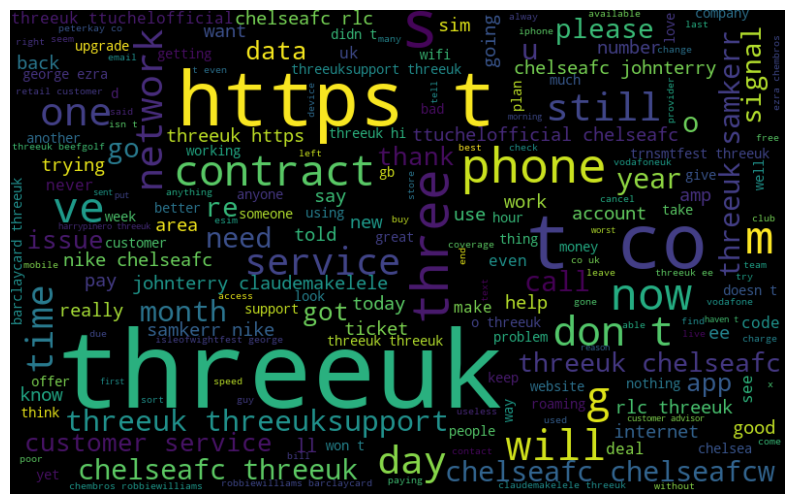

In [19]:
words = ' '.join([text for text in df_subset['Tweet']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state= 21, max_font_size= 110).generate(words)

plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [20]:
print(df_subset[df_subset['Tweet'].str.contains(' threeuk',regex=True)].shape[1])

invalid = df_subset[df_subset['Tweet'].str.contains('chelsea',regex=True)]
invalid.head()

2


,row_id,Tweet
12,13,nebrilez threeuk chelseafc cucurella obsceno
13,14,gordoaka threeuk chelseafc cucurella htt...
14,15,nebrilez threeuk chelseafc cucurella esta...
15,16,gordoaka tengo un contrato firmado con thre...
24,25,the reason is i m really excited to be a part...


In [21]:
# df_subset.drop(invalid)

In [22]:
# df_subset.drop(df_subset['Tweet'].str.contains('chelsea'))

In [23]:
df_subset['Tweet'] = df_subset['Tweet'].str.replace("chelseafc\b", "")
df_subset

,row_id,Tweet
0,1,threeuk you really are pure evil i have had...
1,2,maxdmerc threeuk i ve been on the same contr...
2,3,talkgt threeuk guess you will get it when yo...
3,4,threeuk so it now appears that three are a co...
4,5,maxdmerc threeuk i m with but i ve not hea...
...,...,...
9996,9997,sheikhaljamal threeuk ttuchelofficial chel...
9997,9998,threeuk ttuchelofficial chelseafc because i...
9998,9999,threeuk ttuchelofficial chelseafc i would l...
9999,10000,threeuk threeuksupport between telephone dep...


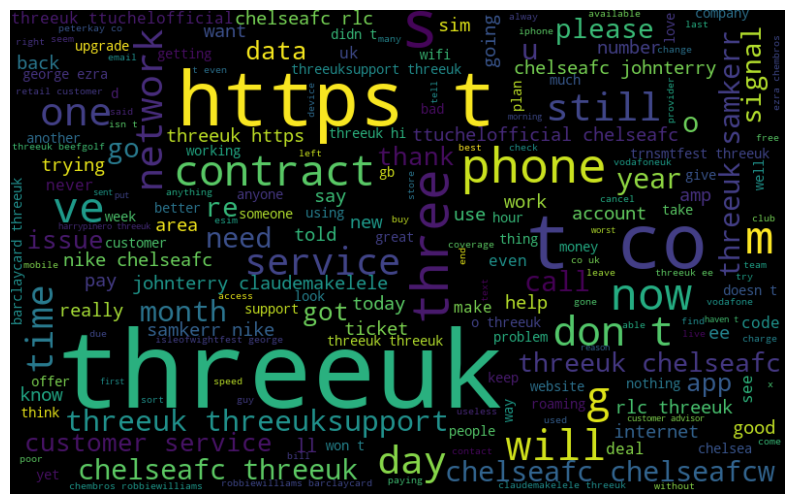

In [24]:
words = ' '.join([text for text in df_subset['Tweet']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state= 21, max_font_size= 110).generate(words)

plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [25]:
print(df_subset[df_subset['Tweet'].str.contains('chealseafc',regex=True)].shape)

invalid = df_subset[df_subset['Tweet'].str.contains('chealseafc',regex=True)]
invalid

(0, 2)


,row_id,Tweet


In [26]:
data['Tweet']

0        .@ThreeUK you really are pure evil. I have had...
1        @MaxdMerc @ThreeUK I’ve been on the same contr...
2        @TalkGT @ThreeUK Guess you will get it when yo...
3        @ThreeUK so it now appears that three are a co...
4        @MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...
                               ...                        
9996     @SheikhAlJamal @ThreeUK @TTuchelofficial @Chel...
9997     @ThreeUK @TTuchelofficial @ChelseaFC because I...
9998     @ThreeUK @TTuchelofficial @ChelseaFC I would l...
9999     @ThreeUK @ThreeUKSupport Between telephone dep...
10000    @ThreeUK @TTuchelofficial @ChelseaFC Would lik...
Name: Tweet, Length: 10001, dtype: object

In [27]:
df = data[data['Tweet'].str.contains('chelsea')]
df

,Date,Tweet,row_id
1075,2022-11-16 13:43:03+00:00,Delighted to share that I’m part of @threeuk W...,1076
1166,2022-11-14 21:07:49+00:00,@ChelseaFCW @ChelseaFC @ThreeUK Has anyone eve...,1167
1182,2022-11-14 19:31:40+00:00,@ChelseaFCW @ThreeUK I think the only thing ke...,1183
1210,2022-11-14 17:01:37+00:00,@ChelseaFCW @ChelseaFC @ThreeUK Viva chelsea 💙,1211
1286,2022-11-12 16:39:46+00:00,"Yesterday I received a message from Three UK ,...",1287
2395,2022-11-07 10:24:48+00:00,Boehly fucked chelsea up from the moment he go...,2396
2682,2022-11-03 14:39:32+00:00,Dalam diam @ThreeUK support pas. Tpi chelsea s...,2683
3491,2022-10-27 16:54:09+00:00,@TheCFCWSocial @RJPJournalism @LondonBluePod @...,3492
3500,2022-10-27 15:19:50+00:00,@TheCFCWSocial @RJPJournalism @LondonBluePod @...,3501
4133,2022-10-21 15:01:59+00:00,"I like this, good there's no sponsor on it, me...",4134


In [28]:
df.shape

(48, 3)

In [29]:
rem_rows = list(df.index.values)
data.drop(rem_rows, inplace = True)

In [30]:
data['Tweet']

0        .@ThreeUK you really are pure evil. I have had...
1        @MaxdMerc @ThreeUK I’ve been on the same contr...
2        @TalkGT @ThreeUK Guess you will get it when yo...
3        @ThreeUK so it now appears that three are a co...
4        @MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...
                               ...                        
9996     @SheikhAlJamal @ThreeUK @TTuchelofficial @Chel...
9997     @ThreeUK @TTuchelofficial @ChelseaFC because I...
9998     @ThreeUK @TTuchelofficial @ChelseaFC I would l...
9999     @ThreeUK @ThreeUKSupport Between telephone dep...
10000    @ThreeUK @TTuchelofficial @ChelseaFC Would lik...
Name: Tweet, Length: 9953, dtype: object

In [31]:
data

,Date,Tweet,row_id
0,2022-11-30 01:58:14+00:00,.@ThreeUK you really are pure evil. I have had...,1
1,2022-11-29 22:47:11+00:00,@MaxdMerc @ThreeUK I’ve been on the same contr...,2
2,2022-11-29 22:28:16+00:00,@TalkGT @ThreeUK Guess you will get it when yo...,3
3,2022-11-29 22:17:47+00:00,@ThreeUK so it now appears that three are a co...,4
4,2022-11-29 21:30:58+00:00,@MaxdMerc @ThreeUK I’m with 3 but I’ve not hea...,5
...,...,...,...
9996,2022-08-18 12:29:32+00:00,@SheikhAlJamal @ThreeUK @TTuchelofficial @Chel...,9997
9997,2022-08-18 12:29:32+00:00,@ThreeUK @TTuchelofficial @ChelseaFC because I...,9998
9998,2022-08-18 12:29:14+00:00,@ThreeUK @TTuchelofficial @ChelseaFC I would l...,9999
9999,2022-08-18 12:28:59+00:00,@ThreeUK @ThreeUKSupport Between telephone dep...,10000


In [32]:
df_subset['token_text'] = df_subset['Tweet'].apply(lambda x: x.split())
df_subset['token_text']

0        [threeuk, you, really, are, pure, evil, i, hav...
1        [maxdmerc, threeuk, i, ve, been, on, the, same...
2        [talkgt, threeuk, guess, you, will, get, it, w...
3        [threeuk, so, it, now, appears, that, three, a...
4        [maxdmerc, threeuk, i, m, with, but, i, ve, no...
                               ...                        
9996     [sheikhaljamal, threeuk, ttuchelofficial, chel...
9997     [threeuk, ttuchelofficial, chelseafc, because,...
9998     [threeuk, ttuchelofficial, chelseafc, i, would...
9999     [threeuk, threeuksupport, between, telephone, ...
10000    [threeuk, ttuchelofficial, chelseafc, would, l...
Name: token_text, Length: 10001, dtype: object

In [33]:
# set up empty dataframe for staging output
df1=pd.DataFrame()
df1['row_id']=['99999999999']
df1['sentiment_type']='NA999NA'
df1['sentiment_score']=0

In [34]:
print('Processing sentiment analysis...')
sid = SentimentIntensityAnalyzer()
t_df = df1
for index, row in df_subset.iterrows():
    scores = sid.polarity_scores(row[1])
    for key, value in scores.items():
        temp = [key,value,row[0]]
        df1['row_id']=row[0]
        df1['sentiment_type']=key
        df1['sentiment_score']=value
        t_df=t_df.append(df1)
#remove dummy row with row_id = 99999999999
t_df_cleaned = t_df[t_df.row_id != '99999999999']
#remove duplicates if any exist
t_df_cleaned = t_df_cleaned.drop_duplicates()
# only keep rows where sentiment_type = compound
t_df_cleaned = t_df[t_df.sentiment_type == 'compound']
print(t_df_cleaned.head(10))

Processing sentiment analysis...


C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The fra

   row_id sentiment_type  sentiment_score
0       1       compound          -0.8841
0       2       compound           0.2732
0       3       compound           0.0000
0       4       compound          -0.4131
0       5       compound           0.0000
0       6       compound           0.0258
0       7       compound          -0.4675
0       8       compound           0.6808
0       9       compound          -0.4588
0      10       compound           0.7269


C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  t_df=t_df.append(df1)
C:\Users\Ndasenda\AppData\Local\Temp\ipykernel_7412\2795772515.py:11: FutureWarning: The fra

In [35]:
#merge dataframes
df_output = pd.merge(df_subset, t_df_cleaned, on='row_id', how='inner')
#printig the sentiments and the tweets
df_output[['Tweet', 'sentiment_score']].head()

,Tweet,sentiment_score
0,threeuk you really are pure evil i have had...,-0.8841
1,maxdmerc threeuk i ve been on the same contr...,0.2732
2,talkgt threeuk guess you will get it when yo...,0.0000
3,threeuk so it now appears that three are a co...,-0.4131
4,maxdmerc threeuk i m with but i ve not hea...,0.0000


In [36]:
df_output[["sentiment_score"]].describe()

,sentiment_score
count,10001.000000
mean,0.058540
std,0.438541
min,-0.973100
25%,-0.177900
50%,0.000000
75%,0.401900
max,0.978200


In [37]:
positive_tweets = df_output[df_output['sentiment_score'] > 0.0]
positive_tweets[['Tweet', 'sentiment_score']].head()

,Tweet,sentiment_score
1,maxdmerc threeuk i ve been on the same contr...,0.2732
5,threeuk desperately need support from as i m ...,0.0258
7,samsunguk threeuk hi i got a new samsung ph...,0.6808
9,are you a threeuk customer get ahead of the ...,0.7269
10,threeuksupport threeuk sometimes show g and...,0.1027


In [50]:
positive_tweets.describe()

,row_id,sentiment_score
count,3987.000000,3987.000000
mean,5189.263858,0.485876
std,2896.641229,0.238553
min,2.000000,0.001800
25%,2735.000000,0.318200
50%,5308.000000,0.459200
75%,7723.000000,0.670500
max,10001.000000,0.978200


In [38]:
positive_tweets.shape

(3987, 5)

In [39]:
positive_tweets.describe()

,row_id,sentiment_score
count,3987.000000,3987.000000
mean,5189.263858,0.485876
std,2896.641229,0.238553
min,2.000000,0.001800
25%,2735.000000,0.318200
50%,5308.000000,0.459200
75%,7723.000000,0.670500
max,10001.000000,0.978200


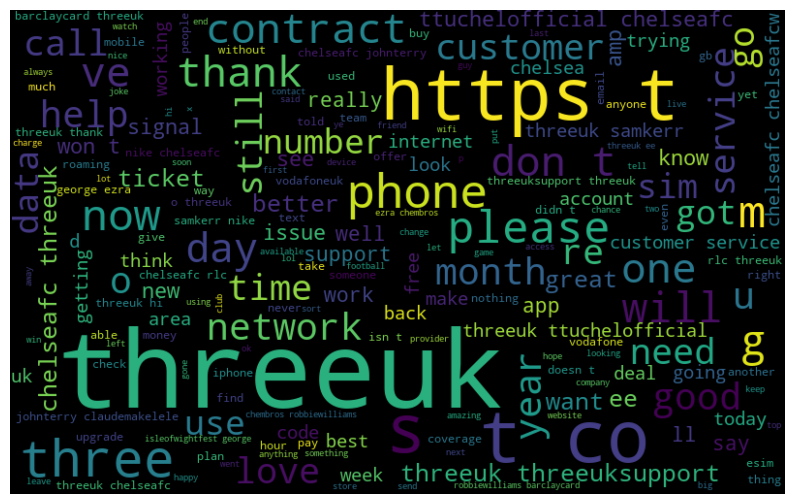

In [40]:
words = ' '.join([text for text in positive_tweets['Tweet']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state= 21, max_font_size= 110).generate(words)

plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [41]:
negative_tweets = df_output[df_output['sentiment_score'] < 0.0]
negative_tweets[['Tweet', 'sentiment_score']].head()

,Tweet,sentiment_score
0,threeuk you really are pure evil i have had...,-0.8841
3,threeuk so it now appears that three are a co...,-0.4131
6,so threeuk are putting their prices up and fo...,-0.4675
8,threeuksupport threeuk hi there i have the ...,-0.4588
14,nebrilez threeuk chelseafc cucurella esta...,-0.2960


In [42]:
negative_tweets.describe()

,row_id,sentiment_score
count,2915.000000,2915.000000
mean,5034.824357,-0.463716
std,2902.527952,0.236195
min,1.000000,-0.973100
25%,2498.000000,-0.648600
50%,5166.000000,-0.467500
75%,7557.000000,-0.296000
max,10000.000000,-0.000800


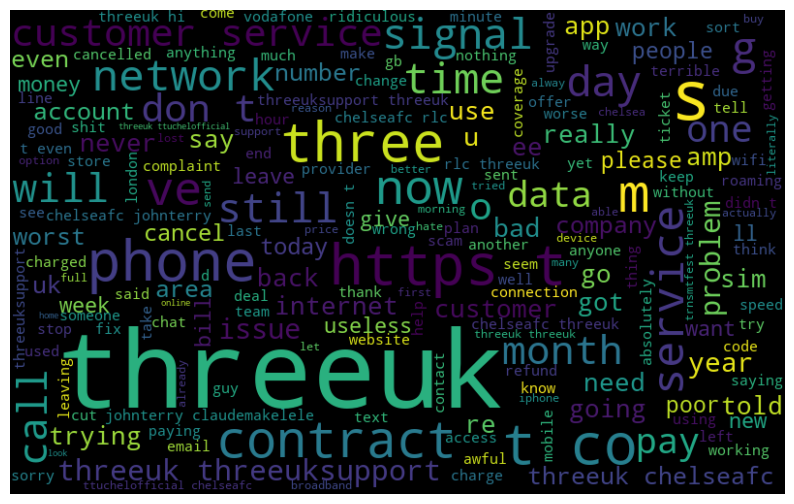

In [43]:
words = ' '.join([text for text in negative_tweets['Tweet']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state= 21, max_font_size= 110).generate(words)

plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [44]:
#Inputing the sentiment polarity values for counting

# list of numbers
list1 = df_output['sentiment_score']

pos_count, neg_count , neutral= 0, 0 ,0

# iterating each number in list
for num in list1:

    # checking condition
    if num > 0:
        pos_count += 1
        
        
    elif num == 0:
        neutral += 1
        
    else:
        neg_count += 1

print("Positive numbers in the list: ", pos_count)
print("Negative numbers in the list: ", neg_count)
print("Neutral numbers in the list are: ", neutral)


Positive numbers in the list:  3987
Negative numbers in the list:  2915
Neutral numbers in the list are:  3099


In [45]:
#Percentages

total = df_output.shape[0]
pos_perce = (pos_count/df_output.shape[0])*100
neg_perce = (neg_count/df_output.shape[0])*100
neu_perce = (neutral/df_output.shape[0])*100

print("From the",df_output.shape[0],"tweets we have", pos_perce,"% that is positive,", neg_perce, "% that is negative and",neu_perce,
      "% that is neutral"
     )

From the 10001 tweets we have 39.86601339866013 % that is positive, 29.14708529147085 % that is negative and 30.986901309869015 % that is neutral


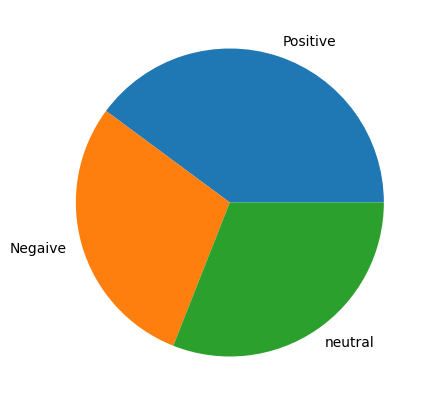

In [46]:
# Creating dataset
polarity = ['Positive', 'Negaive', 'neutral']
 
data = [pos_count, neg_count,neutral]
 
# Creating plot
fig = plt.figure(figsize =(7, 5))
plt.pie(data, labels = polarity)
 
plt.grid()

# show plot
plt.show()

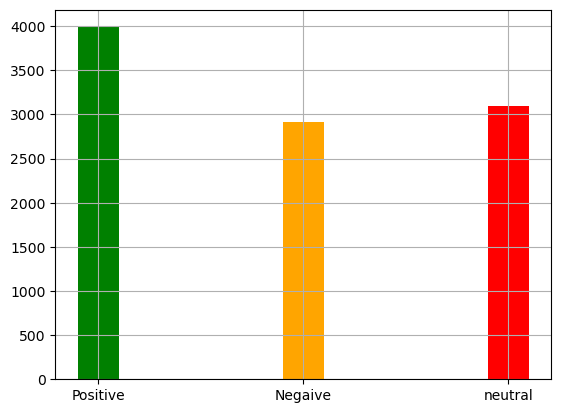

In [49]:
x = polarity = ['Positive', 'Negaive', 'neutral']
y = [pos_count, neg_count,neutral]

c = ['green', 'orange', 'red']

plt.bar(x,y, width = 0.2, color = c)
plt.grid()

plt.show()